In [1]:
%matplotlib inline

import torch
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils
import torch.utils.data
from torch.utils.data import TensorDataset, DataLoader
import torch.optim
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
from tqdm.notebook import tqdm
import os
from PIL import ImageFile
import cv2 as cv
ImageFile.LOAD_TRUNCATED_IMAGES = True

tqdm().pandas()

0it [00:00, ?it/s]

In [2]:
# Root directory for the dataset
data_directory = "C:/Users/User12/GANS/Dataset-Augmented-pt"

# Square root of the number of images to display simultaneously 
num_images = 6

# Height and Width of images
image_size = 128

# Size of latent vector z
z_dim = 256

# Number of channels for images
c_dim = 3

# Wether to initialize bias to 0 in networks layers
initBiasToZero = True

# Size of a batch of images for training
batch_size = 64

# Number of subprocesses to use for data loading
num_workers = 2

# Learning rate for Adam optimizer for generator
lr_gen = 0.001

# Learning rate for Adam optimizer for discriminator
lr_disc = 0.001

# Betas for Adam optimizer for generator
betas_gen = (0.0, 0.999)

# Betas for Adam optimizer for discriminator
betas_disc = (0.0, 0.999)

# Whether to run computations on CPU or GPU
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
print("Device: ", device)

# How many optimizer steps to perform for the discriminator before performing one optimization step for generator 
disc_steps = 1

# Gradient penalize lambda hyper-parameter
lambdaGP = 10.0

# Depth of activation map for each scale block
# depthScales = [512, 512, 512, 512, 256, 128, 64, 32, 16]  original
depthScales = [512, 512, 256, 128, 64, 32]
depthScale0 = depthScales[0]

# Epochs passed between scale updates
# epochScales = [10, 20, 35, 55, 80]
epochScales = [5, 15, 25, 35, 45]
# epochScales = [1, 2, 3, 4, 5]

# Number of times alpha gets updated for each scale
alphaUpdates = [0, 600, 600, 600, 600, 600]

# Number of batches processed between 2 alpha updates for each scale
alphaUpdatesBatches = [0, 16, 16, 16, 16, 16]

Device:  cuda:0


In [3]:
# Set up the dataset for the current output scale
def get_dataloader(current_image_size):
    # Resize each image to have smallest dimension equal to current_image_size and then crop the center of the image in a square shape
    # Get each pixel value from range [0, 255] to [0, 1] with ToTensor()
    # Apply normalization (extract the mean and divide by std) on each channel with canonical values
    # Final pixel values are in range [-1, 1] with mean ~ 0
    current_data_directory = data_directory + "-" + str(current_image_size)
    dataset = datasets.DatasetFolder(root=current_data_directory, loader=torch.load, extensions=('.pt'))

    # Create the dataloader, which will feed batches of images to our discriminator network
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    
    return dataloader

In [4]:
def get_latent_vectors(batch_size, z_dim):
    return torch.randn(batch_size, z_dim, 1, 1, device=device)

In [5]:
def get_latent_truncated(batch_size, z_dim, std):
    return torch.normal(mean=0, std=std, size=(batch_size, z_dim, 1, 1), device=device)

In [6]:
# function for displaying images in a grid
def plot_images(images, num_images=6, title="Real Images"):
    plt.figure(figsize=(10, 10))
    plt.axis(False)
    plt.title(title)
    plt.imshow(np.transpose(torchvision.utils.make_grid(images, nrow=num_images, padding=2, normalize=True).cpu(), (1, 2, 0)))
    plt.show()

## PROGAN

In [7]:
# Returns He's constant for the current layer, a function of the number of weights
def layerWeightsScalingFactor(module):
    # Get the shape of the weights for current layer
    shape = module.weight.shape
    
    return np.sqrt(2.0 / np.prod(shape[1:]))

In [8]:
# Pixelwise feature vector normalization layer
class PixelwiseNormalization(nn.Module):
    def __init__(self):
        super(PixelwiseNormalization, self).__init__()
        
    def forward(self, x, eps=1e-8):
        # Divide each pixel by the square root of the mean of it's corresponding channel values squared
        # Dim=1 is to compute the mean along the channels axis, eps is to avoid division by 0
        norm = (x**2).mean(dim=1, keepdim=True)
        return x / torch.sqrt(norm + eps)

In [9]:
# Add a channel for the minibatch standard deviation to the input
class MiniBatchStd(nn.Module):
    def __init__(self, minibatch_size=4):
        super(MiniBatchStd, self).__init__()
        self.minibatch_size = minibatch_size
    
    def forward(self, x):
        shape = x.shape
        
        # For the last batch of images, which may have a very small number of images
        self.minibatch_size = min(shape[0], self.minibatch_size)
        
        # If the size of the batch isn't a multiple of the size of the minibatch, we can't divide the current batch in minibatches
        if shape[0] % self.minibatch_size != 0 :
            self.minibatch_size = shape[0]
        
        # Compute number of minibatches
        minibatches = int(shape[0] / self.minibatch_size)
        
        # If the current batch has only one image we can't computed the standard deviation
        if self.minibatch_size == 1:
            y = torch.zeros(shape[0], 1, shape[2], shape[3], device=device)
        else:
            # Divide the batch into minibatches
            y = x.view(-1, self.minibatch_size, shape[1], shape[2], shape[3])
            
            # Compute variance across minibatches
            y = torch.var(y, dim=1)
            
            # Get the standard deviation
            y = torch.sqrt(y + 1e-8)
            
            # Get the mean of the std for each minibatch
            y = y.view(minibatches, -1)
            y = torch.mean(y, 1).view(minibatches, 1)
            
            # Reshape the computed values (minibatches, 1) to be able to concatenate to the input
            y = y.expand(minibatches, shape[2] * shape[3])
            y = y.view(minibatches, 1, 1, shape[2], shape[3])
            y = y.expand(minibatches, self.minibatch_size, -1, -1, -1)
            y = y.contiguous().view((-1, 1, shape[2], shape[3]))
            
        # Concatenate input with minibatch std along the channels axis
        return torch.cat([x, y], dim=1)

In [10]:
# Upsampling layer
class Upsample(nn.Module):
    def __init__(self, scale_factor=2):
        super(Upsample, self).__init__()
        self.scale_factor = scale_factor
        
    def forward(self, x):
        shape = x.shape
        # Reshape x 
        x = x.view(shape[0], shape[1], shape[2], 1, shape[3], 1)
        
        # Expand x
        x = x.expand(shape[0], shape[1], shape[2], self.scale_factor, shape[3], self.scale_factor)
        
        # Get x to upsampled shape
        x = x.contiguous().view(shape[0], shape[1], shape[2] * self.scale_factor, shape[3] * self.scale_factor)
        
        return x

In [11]:
class EqualizedLayer(nn.Module):
    def __init__(self, module, initBiasToZero=True, lr_multiplier=1.0):
        super(EqualizedLayer, self).__init__()
        
        self.module = module
        
        if initBiasToZero:
            self.module.bias.data.fill_(0)
        
        self.module.weight.data.normal_(mean=0, std=1)
        self.module.weight.data /= lr_multiplier
        self.weight = layerWeightsScalingFactor(self.module) * lr_multiplier
        
    def forward(self, x):
        x = self.module(x)
        x *= self.weight
        
        return x

In [12]:
class EqualizedConv2d(EqualizedLayer):
    def __init__(self, in_channels, out_channels, kernel_size, padding=0, bias=True):
        EqualizedLayer.__init__(self, nn.Conv2d(in_channels, out_channels, kernel_size, padding=padding, bias=bias))

In [13]:
class EqualizedLinear(EqualizedLayer):
    def __init__(self, in_features, out_features, bias=True):
        EqualizedLayer.__init__(self, nn.Linear(in_features, out_features, bias=bias))

In [14]:
# Generator component of the GAN
class Generator(nn.Module):
    def __init__(self, depthScale0, initBiasToZero=True):
        super(Generator, self).__init__()
        self.initBiasToZero = initBiasToZero
        
        # Initialize the scales
        self.depthScale0 = depthScale0
        self.scalesDepth = [depthScale0]
        self.scaleLayers = nn.ModuleList()
        self.toRGBLayers = nn.ModuleList()
        
        # Initialize the first scale
        self.formatLayer = EqualizedLinear(z_dim, 16 * self.scalesDepth[0], bias=self.initBiasToZero)
        self.groupScale0 = nn.ModuleList()
        self.groupScale0.append(EqualizedConv2d(depthScale0, depthScale0, kernel_size=3, padding=1, bias=self.initBiasToZero))
        self.toRGBLayers.append(EqualizedConv2d(depthScale0, c_dim, kernel_size=1, bias=self.initBiasToZero))
        
        # Initialize the upsample interpolation parameter
        self.alpha = 0
        
        # Leaky ReLU activation function
        self.leakyRelu = nn.LeakyReLU(0.2)
        
        # Pixelwise feature vector normalization
        self.pixelNorm = PixelwiseNormalization()
        
        # Upsample layer
        self.upsample = Upsample(2)
        
        # Final activation function
        self.tanh = nn.Tanh()
    
    # Get the Height (=Width) of the image generated with current architecture
    def getCurrentOutputSize(self):
        # Each RGB layer of the model (except first) means that the 4x4 input got upsampled once
        return 4 * (2 ** (len(self.toRGBLayers) - 1))
    
    # Adds a new scale block to the generator making the output H(=W) twice larger
    def addScaleBlock(self, depthScaleNew):
        # Get depth for previous scale
        depthScalePrevious = self.scalesDepth[-1]
        
        # Append new scale depth
        self.scalesDepth.append(depthScaleNew)
        
        # Add new scale block
        self.scaleLayers.append(nn.ModuleList())
        
        # Add layers to the new scale block
        self.scaleLayers[-1].append(EqualizedConv2d(depthScalePrevious, depthScaleNew, kernel_size=3, padding=1, bias=self.initBiasToZero))
        self.scaleLayers[-1].append(EqualizedConv2d(depthScaleNew, depthScaleNew, kernel_size=3, padding=1, bias=self.initBiasToZero))
        
        # Add to RGB layer corresponding to new scale
        self.toRGBLayers.append(EqualizedConv2d(depthScaleNew, c_dim, kernel_size=1, bias=self.initBiasToZero))
    
    # Update the value of the interpolation parameter alpha
    def updateAlpha(self, alpha):
        # We can't interpolate while only the first scale block has been added
        assert len(self.toRGBLayers) > 1
        
        if alpha < 1e-5:
            self.alpha = 0
        else:
            self.alpha = alpha
        
    def forward(self, x):
        # Apply pixelwise normalization
        x = self.pixelNorm(x)
        
        # Flatten the input tensor for linear layer (shape = (batch_size, z_dim))
        x = x.view(-1, np.prod(x.shape[1:]))
        
        # Format x to shape (batch_size, 4*4*depthScale0) and apply leakyRelu
        x = self.formatLayer(x)
        x = self.leakyRelu(x)
        
        # Reshape x to (batch_size, depthScale0, 4, 4)
        x = x.view(x.shape[0], self.depthScale0, 4, 4)
        
        # Apply pixelwise normalization
        x = self.pixelNorm(x)
        
        # Scale 0
        # Apply each convolution in the current scale block, followed by a leakyRelu activation and pixelwise normalization
        for conv in self.groupScale0:
            x = conv(x)
            x = self.leakyRelu(x)
            x = self.pixelNorm(x)
        
        # If we have only one other scale and we want to interpolate, convert the current tensor to RGB and upsample
        if len(self.scaleLayers) == 1 and self.alpha > 0:
            y = self.toRGBLayers[0](x)
            y = self.upsample(y)
            
        # Other scales
        # Upsample x and then same as before
        for scaleIdx, groupScale in enumerate(self.scaleLayers):
            x = self.upsample(x)
            for conv in groupScale:
                x = conv(x)
                x = self.leakyRelu(x)
                x = self.pixelNorm(x)
            
            # If this is the penultimate scale, convert the tensor to RGB and upsample for interpolation
            if (scaleIdx == len(self.scaleLayers) - 2) and self.alpha > 0:
                y = self.toRGBLayers[scaleIdx + 1](x)
                y = self.upsample(y)
        
        # Convert to RGB
        x = self.toRGBLayers[-1](x)
        
        # Interpolate with the previous scale (upsampled)
        if self.alpha > 0:
            x = self.alpha * y + (1.0 - self.alpha) * x
        
        # Get pixels in [-1,1] range
        x = self.tanh(x)
        
        return x

In [15]:
# Discriminator component of GAN
class Discriminator(nn.Module):
    def __init__(self, depthScale0, initBiasToZero=True):
        super(Discriminator, self).__init__()
        self.initBiasToZero = initBiasToZero
        
        # Initialize the scales
        self.scalesDepth = [depthScale0]
        self.scaleLayers = nn.ModuleList()
        self.fromRGBLayers = nn.ModuleList()
        # self.mergeLayers = nn.ModuleList()
        
        # Create linear output layer
        self.outputLayer = EqualizedLinear(depthScale0, 1, bias=self.initBiasToZero)
        
        # Initialize the first scale
        self.groupScale0 = nn.ModuleList()
        self.fromRGBLayers.append(EqualizedConv2d(c_dim, depthScale0, kernel_size=1, bias=self.initBiasToZero))
        
        # Minibatch standard deviation layer
        self.minibatchStd = MiniBatchStd(minibatch_size=4)
        
        # This conv layer gets the input with an additional channel for minibatch std
        self.groupScale0.append(EqualizedConv2d(depthScale0+1, depthScale0, kernel_size=3, padding=1,bias=initBiasToZero))
        
        self.groupScale0.append(EqualizedLinear(depthScale0 * 16, depthScale0, bias=initBiasToZero))
        
        # Initialize the downsample interpolation parameter
        self.alpha = 0
        
        # LeakyReLU activation function
        self.leakyRelu = nn.LeakyReLU(0.2)
        
        # Average pooling layer
        self.avgPool2d = nn.AvgPool2d(kernel_size=2)
    
    # Adds a new scale block to the discriminator making the output H(=W) twice smaller
    def addScaleBlock(self, depthScaleNew):
        # Get depth for previous scale
        depthScalePrevious = self.scalesDepth[-1]
        
        # Append new scale depth
        self.scalesDepth.append(depthScaleNew)
        
        # Add new scale block
        self.scaleLayers.append(nn.ModuleList())
        
        # Add layers to the new scale block
        self.scaleLayers[-1].append(EqualizedConv2d(depthScaleNew, depthScaleNew, kernel_size=3, padding=1, bias=self.initBiasToZero))
        self.scaleLayers[-1].append(EqualizedConv2d(depthScaleNew, depthScalePrevious, kernel_size=3, padding=1, bias=self.initBiasToZero))
        
        # Add to RGB layer corresponding to new scale
        self.fromRGBLayers.append(EqualizedConv2d(c_dim, depthScaleNew, kernel_size=1, bias=self.initBiasToZero))
    
    # Update the value of the interpolation parameter alpha
    def updateAlpha(self, alpha):
        # We can't interpolate while only the first scale block has been added
        assert len(self.fromRGBLayers) > 1
        
        if alpha < 1e-5:
            self.alpha = 0
        else:
            self.alpha = alpha

    # REVISE COMMENTS
    def forward(self, x):
        # If we have at least 2 scales
        if self.alpha > 0 and len(self.fromRGBLayers) > 1:
            y = self.avgPool2d(x)
            y = self.fromRGBLayers[-2](y)
            y = self.leakyRelu(y)
        
        # 
        x = self.fromRGBLayers[-1](x)
        x = self.leakyRelu(x)
        
        # Get through each scale from the last to the one before scale0
        
        # Set interpolated flag to False
        alreadyInterpolated = False
        
        for groupScale in reversed(self.scaleLayers):
            
            # Apply each convolution in the current scale block, followed by a leakyRelu activation
            for conv in groupScale:
                x = conv(x)
                x = self.leakyRelu(x)
            
            # Downsample x
            x = self.avgPool2d(x)
        
            if len(self.scaleLayers) > 1 and alpha > 0 and not alreadyInterpolated:
                alreadyInterpolated = True
                x = self.alpha * y + (1 - self.alpha) * x
            
        # Scale0
        # Apply the minibatch standard deviation layer
        x = self.minibatchStd(x)
        
        # Apply first convolution in scale block 0, followed by leakyReLU
        x = self.groupScale0[0](x)
        x = self.leakyRelu(x)
        
        # Flatten x for the next linear layer
        x = x.view(-1, np.prod(x.shape[1:]))
        
        # Apply linear layer of scale block 0, followed by leakyReLU
        x = self.groupScale0[1](x)
        x = self.leakyRelu(x)
        
        # Get final output values for each example in the batch
        x = self.outputLayer(x)
        
        return x

In [16]:
# Create the generator
gen = Generator(depthScale0, initBiasToZero).to(device)

# Visualize the structure of the generator
print(gen)

Generator(
  (scaleLayers): ModuleList()
  (toRGBLayers): ModuleList(
    (0): EqualizedConv2d(
      (module): Conv2d(512, 3, kernel_size=(1, 1), stride=(1, 1))
    )
  )
  (formatLayer): EqualizedLinear(
    (module): Linear(in_features=256, out_features=8192, bias=True)
  )
  (groupScale0): ModuleList(
    (0): EqualizedConv2d(
      (module): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (leakyRelu): LeakyReLU(negative_slope=0.2)
  (pixelNorm): PixelwiseNormalization()
  (upsample): Upsample()
  (tanh): Tanh()
)


In [17]:
# Create the discriminator
disc = Discriminator(depthScale0, initBiasToZero).to(device)

# Visualize the structure of the discriminator
print(disc)

Discriminator(
  (scaleLayers): ModuleList()
  (fromRGBLayers): ModuleList(
    (0): EqualizedConv2d(
      (module): Conv2d(3, 512, kernel_size=(1, 1), stride=(1, 1))
    )
  )
  (outputLayer): EqualizedLinear(
    (module): Linear(in_features=512, out_features=1, bias=True)
  )
  (groupScale0): ModuleList(
    (0): EqualizedConv2d(
      (module): Conv2d(513, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): EqualizedLinear(
      (module): Linear(in_features=8192, out_features=512, bias=True)
    )
  )
  (minibatchStd): MiniBatchStd()
  (leakyRelu): LeakyReLU(negative_slope=0.2)
  (avgPool2d): AvgPool2d(kernel_size=2, stride=2, padding=0)
)


In [18]:
# Penalize gradients to encourage 1-Lipschitz continuity on Wasserstein loss function
def gradient_penalty(disc, images_fake, images_real, lambdaGP):
    # Interpolate between the real and fake images in current batch
    interp_params = torch.rand(images_real.shape[0], 1, 1, 1).to(device)
    interp_params = interp_params.expand_as(images_real)
    
    interps = interp_params * images_real + (1 - interp_params) * images_fake
    #interps.requires_grad = True

    # Get discriminator (critic)'s predictions on interpolates
    preds = disc(interps)
    
    grad_outputs = torch.ones_like(preds)
    
    # Get gradients
    gradients = torch.autograd.grad(outputs=preds, inputs=interps, grad_outputs=grad_outputs, create_graph=True, only_inputs=True)[0]
    
    # Reshape gradients to extract norm for each image
    gradients = gradients.view(images_real.shape[0], -1)
    
    # Compute gradient penalty
    grad_penalty = lambdaGP * ((torch.linalg.norm(gradients, ord=2, dim=1) - 1) ** 2).mean()

    return grad_penalty

In [19]:
def train_discriminator(disc, gen, images_real, lambdaGP, disc_optimizer):  
    # Get predictions for real images
    preds_real = disc(images_real)
    
    # Compute loss for real images
    disc_loss_real = preds_real.mean()
    # print(f"real: {disc_loss_real}")
    
    # Get latent vectors to feed to the generator
    latent_vectors = get_latent_vectors(images_real.shape[0], z_dim)
    
    # Generate a batch of fake images
    images_fake = gen(latent_vectors)
    
    # Get predictions for fake images
    # Detach the tensor so that the generator doesn't get updated in the backward pass for the discriminator loss
    preds_fake = disc(images_fake.detach())
    
    # Compute loss for fake images
    disc_loss_fake = preds_fake.mean()
    # print(f"fake: {disc_loss_fake}")
    
    # Compute gradient penalty
    grad_penalty = gradient_penalty(disc, images_fake, images_real, lambdaGP)
    # print(f"gradient_penalty: {grad_penalty}")
    
    # Reset gradients of discriminator
    disc.zero_grad()
    
    # Compute total loss
    total_loss = disc_loss_fake - disc_loss_real + grad_penalty
    
    # Get gradients for total loss and perform an optimization step
    total_loss.backward()
    disc_optimizer.step()
    
    # print(f"disc_loss_total {total_loss}")
    # print()
    
    return total_loss.item()

In [20]:
def train_generator(gen, disc, gen_optimizer):
    # Reset gradients for generator
    gen.zero_grad()
    
    # Get latent vectors to feed to the generator
    latent_vectors = get_latent_vectors(batch_size, z_dim)
    
    # Generate fake images
    images_fake = gen(latent_vectors)
    
    # Get predictions for fake images
    preds_fake = disc(images_fake)
    
    # Compute generator loss
    gen_loss = - preds_fake.mean()
    # print(f"gen_loss: {gen_loss}")
    
    # Compute gradients for generator
    gen_loss.backward()
    
    # Update generator
    gen_optimizer.step()
    
    return gen_loss.item()

In [21]:
# Define the optimizer for each network
gen_optimizer = torch.optim.Adam(gen.parameters(), lr_gen, betas_gen)
disc_optimizer = torch.optim.Adam(disc.parameters(), lr_disc, betas_disc)

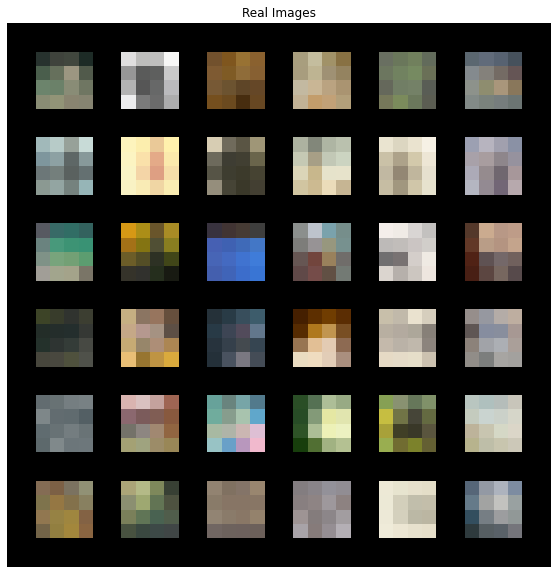

Current scale: 4 x 4



In [22]:
# Total epochs of training for current model
total_epochs = 0

# Record loss for each network
disc_losses = []
gen_losses = []

# Fixed set of latent vectors to generate images from after each epoch in order to visualize Generator progress
fixed_latent_vectors = get_latent_vectors(num_images ** 2, z_dim)

# Current scale
scale = 0

# Set current image size
current_image_size = 4

# Set up dataloader for 4 x 4 resolution
dataloader = get_dataloader(current_image_size)
# dataloader = get_dataloader(current_image_size, False)

# Show some real images at current scale
images = next(iter(dataloader))[0][:num_images ** 2]
plot_images(images)

print(f"Current scale: {current_image_size} x {current_image_size}")
print()

Epoch 1/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 1/60:   Disc_loss: -0.20092871611604113    Gen_loss: -0.14720842099797002


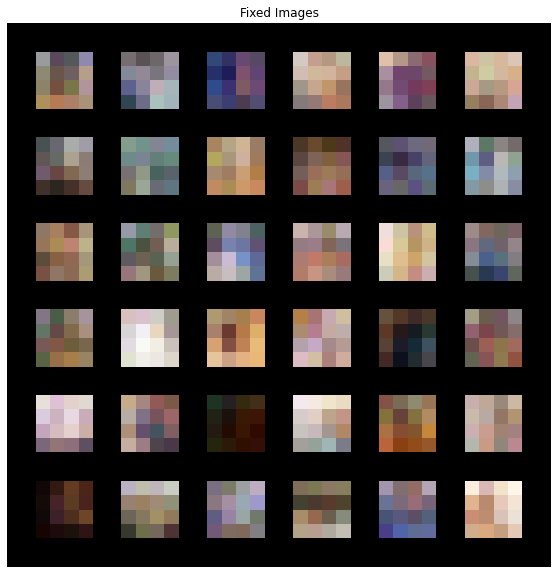

Epoch 2/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 2/60:   Disc_loss: -0.11065803272559924    Gen_loss: -1.2833087827199228


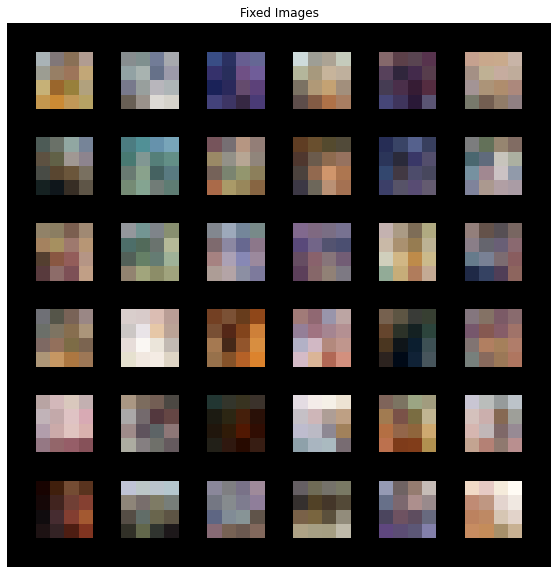

Epoch 3/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 3/60:   Disc_loss: -0.10751412070871318    Gen_loss: -0.5292766194650634


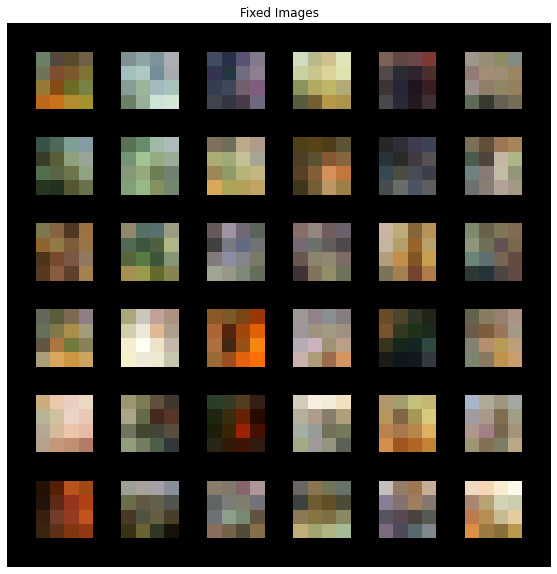

Epoch 4/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 4/60:   Disc_loss: -0.0850640113284248    Gen_loss: 0.20054390995578414


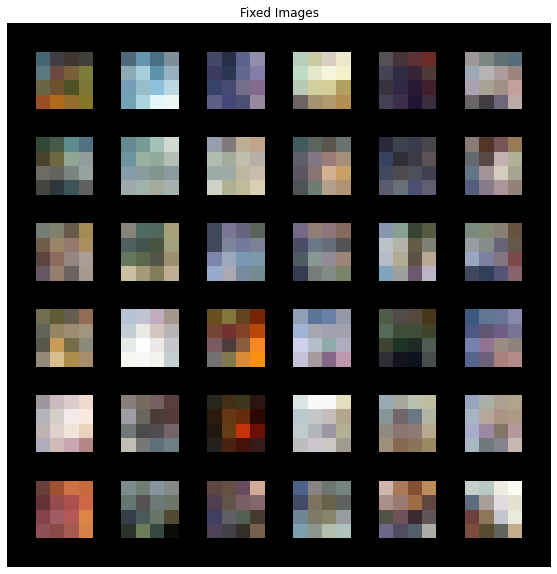

Epoch 5/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 5/60:   Disc_loss: -0.023434403189861706    Gen_loss: 0.6596339370072003


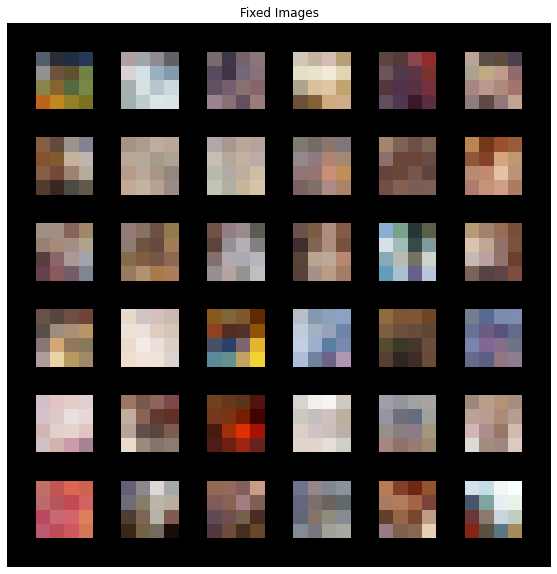

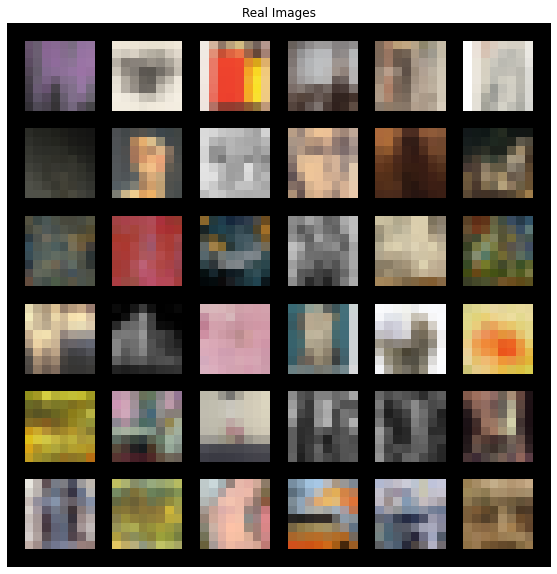


Current scale: 8 x 8

Epoch 6/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.9983333333333333
Alpha: 0.9966666666666666
Alpha: 0.9949999999999999
Alpha: 0.9933333333333332
Alpha: 0.9916666666666665
Alpha: 0.9899999999999998
Alpha: 0.9883333333333331
Alpha: 0.9866666666666664
Alpha: 0.9849999999999997
Alpha: 0.983333333333333
Alpha: 0.9816666666666662
Alpha: 0.9799999999999995
Alpha: 0.9783333333333328
Alpha: 0.9766666666666661
Alpha: 0.9749999999999994
Alpha: 0.9733333333333327
Alpha: 0.971666666666666
Alpha: 0.9699999999999993
Alpha: 0.9683333333333326
Alpha: 0.9666666666666659
Alpha: 0.9649999999999992
Alpha: 0.9633333333333325
Alpha: 0.9616666666666658
Alpha: 0.9599999999999991
Alpha: 0.9583333333333324
Alpha: 0.9566666666666657
Alpha: 0.954999999999999
Alpha: 0.9533333333333323
Alpha: 0.9516666666666656
Alpha: 0.9499999999999988
Alpha: 0.9483333333333321
Alpha: 0.9466666666666654
Alpha: 0.9449999999999987
Alpha: 0.943333333333332
Alpha: 0.9416666666666653
Alpha: 0.9399999999999986
Alpha: 0.9383333333333319
Alpha: 0.9366666666666652
Alpha: 0.9349999

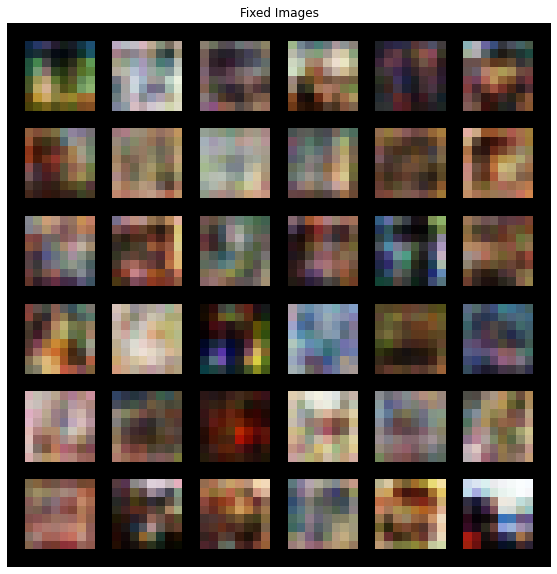

Epoch 7/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.7283333333333271
Alpha: 0.7266666666666604
Alpha: 0.7249999999999936
Alpha: 0.7233333333333269
Alpha: 0.7216666666666602
Alpha: 0.7199999999999935
Alpha: 0.7183333333333268
Alpha: 0.7166666666666601
Alpha: 0.7149999999999934
Alpha: 0.7133333333333267
Alpha: 0.71166666666666
Alpha: 0.7099999999999933
Alpha: 0.7083333333333266
Alpha: 0.7066666666666599
Alpha: 0.7049999999999932
Alpha: 0.7033333333333265
Alpha: 0.7016666666666598
Alpha: 0.6999999999999931
Alpha: 0.6983333333333264
Alpha: 0.6966666666666597
Alpha: 0.694999999999993
Alpha: 0.6933333333333263
Alpha: 0.6916666666666595
Alpha: 0.6899999999999928
Alpha: 0.6883333333333261
Alpha: 0.6866666666666594
Alpha: 0.6849999999999927
Alpha: 0.683333333333326
Alpha: 0.6816666666666593
Alpha: 0.6799999999999926
Alpha: 0.6783333333333259
Alpha: 0.6766666666666592
Alpha: 0.6749999999999925
Alpha: 0.6733333333333258
Alpha: 0.6716666666666591
Alpha: 0.6699999999999924
Alpha: 0.6683333333333257
Alpha: 0.666666666666659
Alpha: 0.66499999

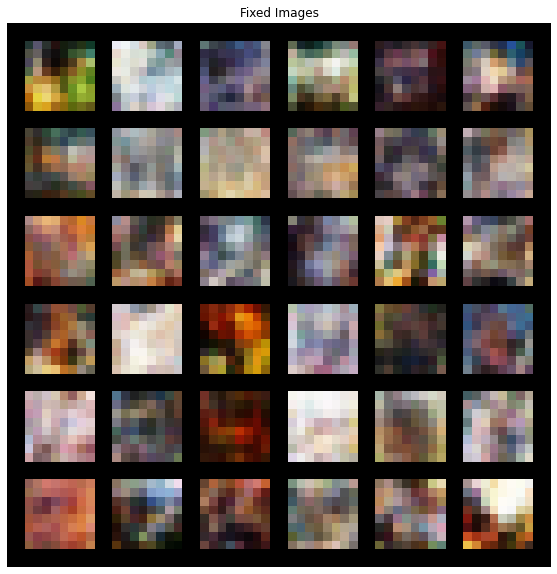

Epoch 8/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.45833333333332227
Alpha: 0.4566666666666556
Alpha: 0.45499999999998897
Alpha: 0.4533333333333223
Alpha: 0.45166666666665567
Alpha: 0.449999999999989
Alpha: 0.44833333333332237
Alpha: 0.4466666666666557
Alpha: 0.44499999999998907
Alpha: 0.4433333333333224
Alpha: 0.44166666666665577
Alpha: 0.4399999999999891
Alpha: 0.4383333333333225
Alpha: 0.4366666666666558
Alpha: 0.4349999999999892
Alpha: 0.4333333333333225
Alpha: 0.4316666666666559
Alpha: 0.4299999999999892
Alpha: 0.4283333333333226
Alpha: 0.4266666666666559
Alpha: 0.4249999999999893
Alpha: 0.4233333333333226
Alpha: 0.421666666666656
Alpha: 0.4199999999999893
Alpha: 0.4183333333333227
Alpha: 0.416666666666656
Alpha: 0.4149999999999894
Alpha: 0.4133333333333227
Alpha: 0.4116666666666561
Alpha: 0.40999999999998943
Alpha: 0.4083333333333228
Alpha: 0.40666666666665613
Alpha: 0.4049999999999895
Alpha: 0.40333333333332283
Alpha: 0.4016666666666562
Alpha: 0.39999999999998953
Alpha: 0.3983333333333229
Alpha: 0.39666666666665623
Alph

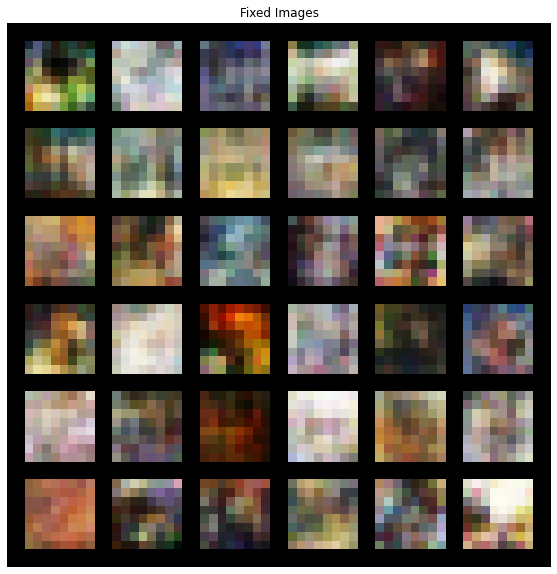

Epoch 9/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.18833333333332397
Alpha: 0.1866666666666573
Alpha: 0.18499999999999062
Alpha: 0.18333333333332394
Alpha: 0.18166666666665726
Alpha: 0.17999999999999058
Alpha: 0.1783333333333239
Alpha: 0.17666666666665723
Alpha: 0.17499999999999055
Alpha: 0.17333333333332387
Alpha: 0.1716666666666572
Alpha: 0.16999999999999052
Alpha: 0.16833333333332384
Alpha: 0.16666666666665717
Alpha: 0.1649999999999905
Alpha: 0.1633333333333238
Alpha: 0.16166666666665713
Alpha: 0.15999999999999046
Alpha: 0.15833333333332378
Alpha: 0.1566666666666571
Alpha: 0.15499999999999042
Alpha: 0.15333333333332375
Alpha: 0.15166666666665707
Alpha: 0.1499999999999904
Alpha: 0.1483333333333237
Alpha: 0.14666666666665704
Alpha: 0.14499999999999036
Alpha: 0.14333333333332368
Alpha: 0.141666666666657
Alpha: 0.13999999999999033
Alpha: 0.13833333333332365
Alpha: 0.13666666666665697
Alpha: 0.1349999999999903
Alpha: 0.13333333333332362
Alpha: 0.13166666666665694
Alpha: 0.12999999999999026
Alpha: 0.12833333333332358
Alpha: 0.126

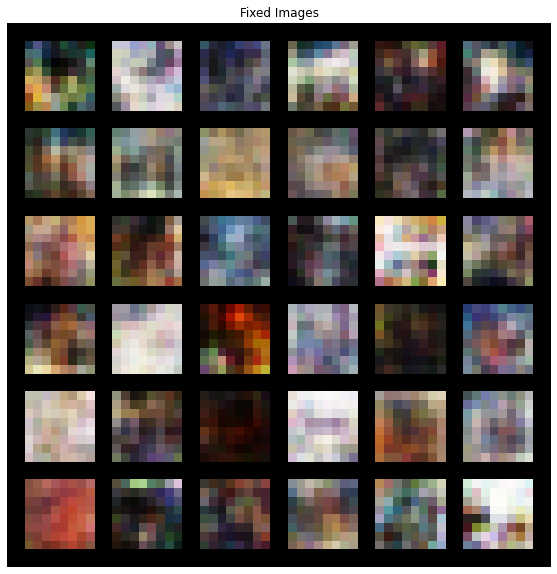

Epoch 10/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 10/60:   Disc_loss: -0.21180021417020373    Gen_loss: 0.3797267188217584


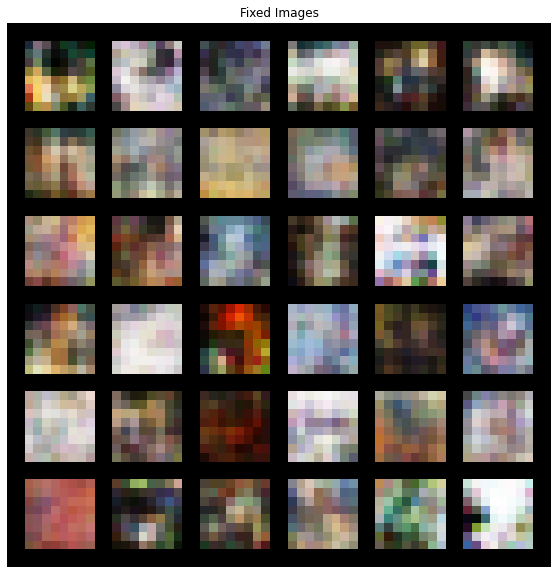

Epoch 11/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 11/60:   Disc_loss: -0.1772402392201456    Gen_loss: 0.4520261671234403


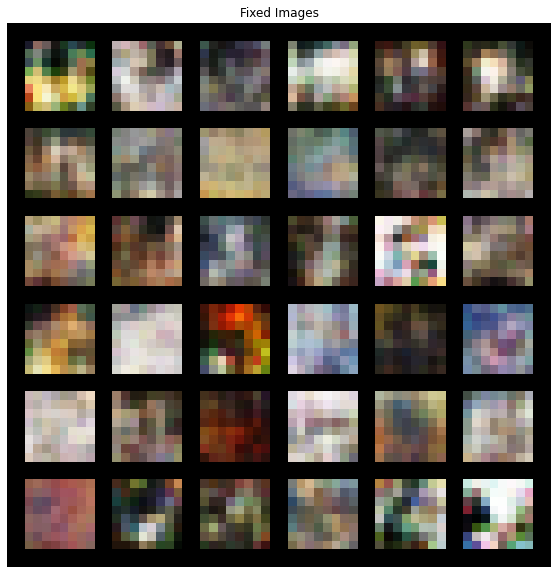

Epoch 12/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 12/60:   Disc_loss: -0.1526114505624151    Gen_loss: 0.3387774566001831


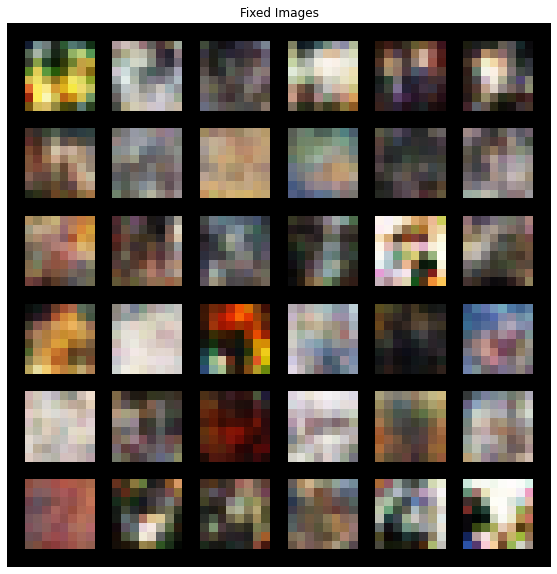

Epoch 13/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 13/60:   Disc_loss: -0.1471960785193997    Gen_loss: 0.28954668691442825


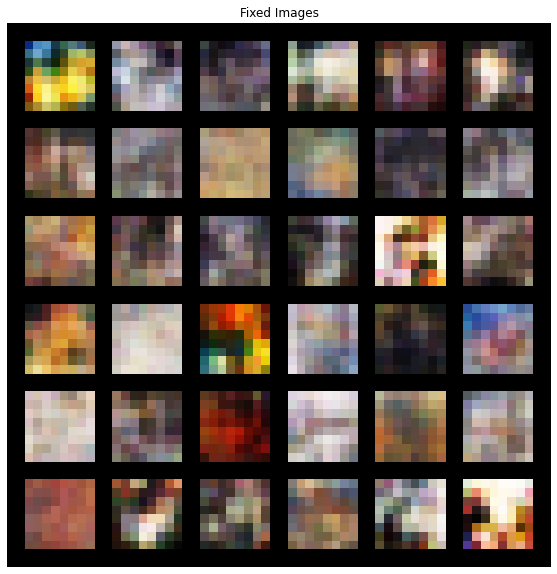

Epoch 14/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 14/60:   Disc_loss: -0.14749011325583522    Gen_loss: 0.22700276858171517


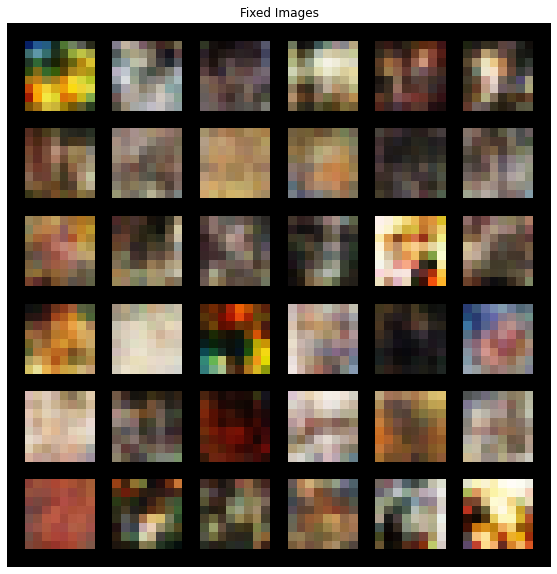

Epoch 15/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 15/60:   Disc_loss: -0.151949427770684    Gen_loss: 0.20315798289305845


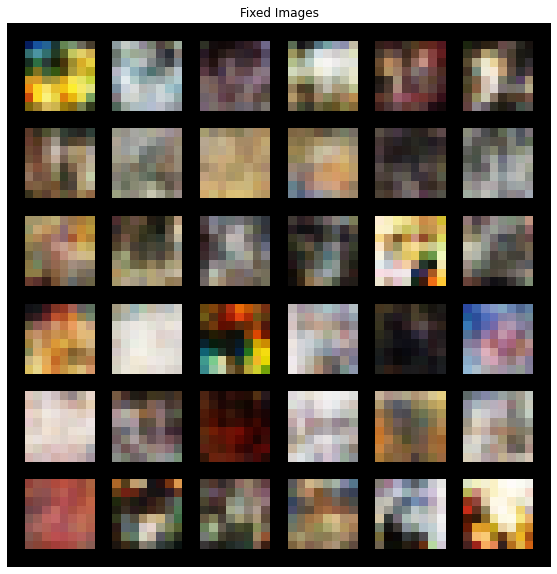

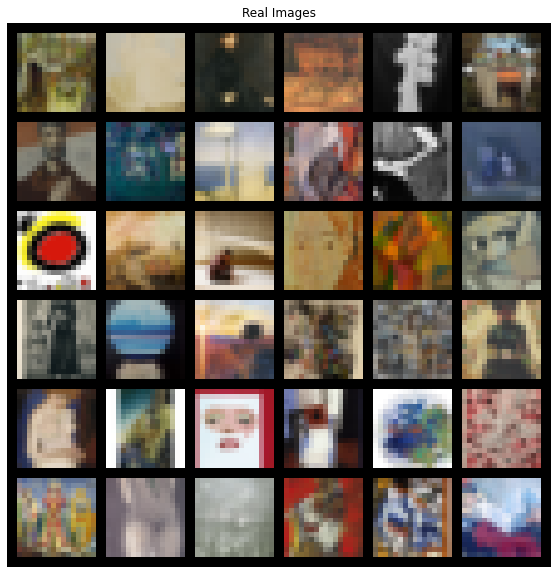


Current scale: 16 x 16

Epoch 16/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.9983333333333333
Alpha: 0.9966666666666666
Alpha: 0.9949999999999999
Alpha: 0.9933333333333332
Alpha: 0.9916666666666665
Alpha: 0.9899999999999998
Alpha: 0.9883333333333331
Alpha: 0.9866666666666664
Alpha: 0.9849999999999997
Alpha: 0.983333333333333
Alpha: 0.9816666666666662
Alpha: 0.9799999999999995
Alpha: 0.9783333333333328
Alpha: 0.9766666666666661
Alpha: 0.9749999999999994
Alpha: 0.9733333333333327
Alpha: 0.971666666666666
Alpha: 0.9699999999999993
Alpha: 0.9683333333333326
Alpha: 0.9666666666666659
Alpha: 0.9649999999999992
Alpha: 0.9633333333333325
Alpha: 0.9616666666666658
Alpha: 0.9599999999999991
Alpha: 0.9583333333333324
Alpha: 0.9566666666666657
Alpha: 0.954999999999999
Alpha: 0.9533333333333323
Alpha: 0.9516666666666656
Alpha: 0.9499999999999988
Alpha: 0.9483333333333321
Alpha: 0.9466666666666654
Alpha: 0.9449999999999987
Alpha: 0.943333333333332
Alpha: 0.9416666666666653
Alpha: 0.9399999999999986
Alpha: 0.9383333333333319
Alpha: 0.9366666666666652
Alpha: 0.9349999

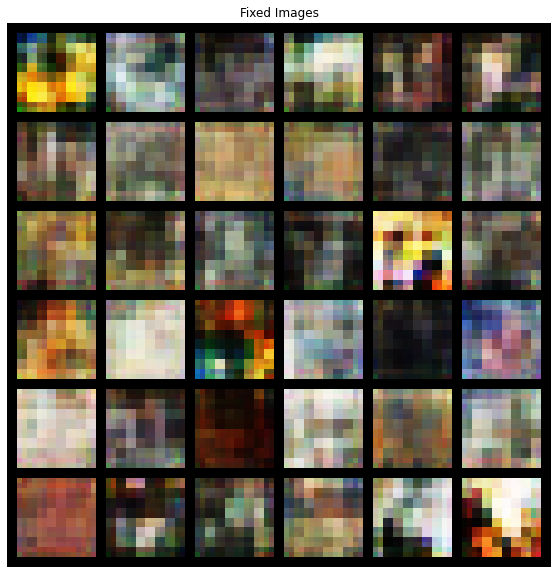

Epoch 17/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.7283333333333271
Alpha: 0.7266666666666604
Alpha: 0.7249999999999936
Alpha: 0.7233333333333269
Alpha: 0.7216666666666602
Alpha: 0.7199999999999935
Alpha: 0.7183333333333268
Alpha: 0.7166666666666601
Alpha: 0.7149999999999934
Alpha: 0.7133333333333267
Alpha: 0.71166666666666
Alpha: 0.7099999999999933
Alpha: 0.7083333333333266
Alpha: 0.7066666666666599
Alpha: 0.7049999999999932
Alpha: 0.7033333333333265
Alpha: 0.7016666666666598
Alpha: 0.6999999999999931
Alpha: 0.6983333333333264
Alpha: 0.6966666666666597
Alpha: 0.694999999999993
Alpha: 0.6933333333333263
Alpha: 0.6916666666666595
Alpha: 0.6899999999999928
Alpha: 0.6883333333333261
Alpha: 0.6866666666666594
Alpha: 0.6849999999999927
Alpha: 0.683333333333326
Alpha: 0.6816666666666593
Alpha: 0.6799999999999926
Alpha: 0.6783333333333259
Alpha: 0.6766666666666592
Alpha: 0.6749999999999925
Alpha: 0.6733333333333258
Alpha: 0.6716666666666591
Alpha: 0.6699999999999924
Alpha: 0.6683333333333257
Alpha: 0.666666666666659
Alpha: 0.66499999

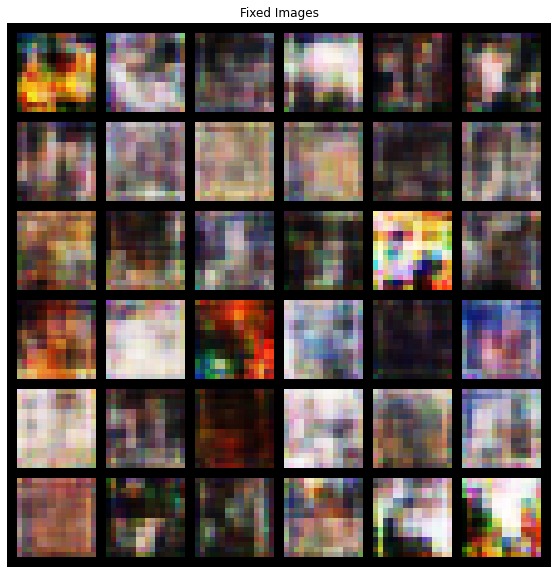

Epoch 18/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.45833333333332227
Alpha: 0.4566666666666556
Alpha: 0.45499999999998897
Alpha: 0.4533333333333223
Alpha: 0.45166666666665567
Alpha: 0.449999999999989
Alpha: 0.44833333333332237
Alpha: 0.4466666666666557
Alpha: 0.44499999999998907
Alpha: 0.4433333333333224
Alpha: 0.44166666666665577
Alpha: 0.4399999999999891
Alpha: 0.4383333333333225
Alpha: 0.4366666666666558
Alpha: 0.4349999999999892
Alpha: 0.4333333333333225
Alpha: 0.4316666666666559
Alpha: 0.4299999999999892
Alpha: 0.4283333333333226
Alpha: 0.4266666666666559
Alpha: 0.4249999999999893
Alpha: 0.4233333333333226
Alpha: 0.421666666666656
Alpha: 0.4199999999999893
Alpha: 0.4183333333333227
Alpha: 0.416666666666656
Alpha: 0.4149999999999894
Alpha: 0.4133333333333227
Alpha: 0.4116666666666561
Alpha: 0.40999999999998943
Alpha: 0.4083333333333228
Alpha: 0.40666666666665613
Alpha: 0.4049999999999895
Alpha: 0.40333333333332283
Alpha: 0.4016666666666562
Alpha: 0.39999999999998953
Alpha: 0.3983333333333229
Alpha: 0.39666666666665623
Alph

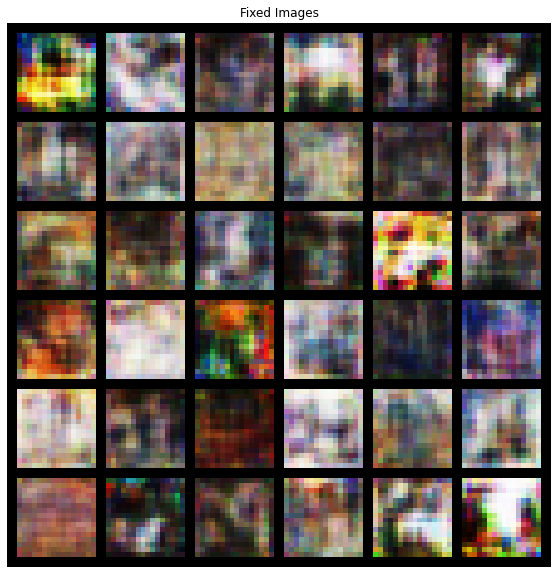

Epoch 19/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.18833333333332397
Alpha: 0.1866666666666573
Alpha: 0.18499999999999062
Alpha: 0.18333333333332394
Alpha: 0.18166666666665726
Alpha: 0.17999999999999058
Alpha: 0.1783333333333239
Alpha: 0.17666666666665723
Alpha: 0.17499999999999055
Alpha: 0.17333333333332387
Alpha: 0.1716666666666572
Alpha: 0.16999999999999052
Alpha: 0.16833333333332384
Alpha: 0.16666666666665717
Alpha: 0.1649999999999905
Alpha: 0.1633333333333238
Alpha: 0.16166666666665713
Alpha: 0.15999999999999046
Alpha: 0.15833333333332378
Alpha: 0.1566666666666571
Alpha: 0.15499999999999042
Alpha: 0.15333333333332375
Alpha: 0.15166666666665707
Alpha: 0.1499999999999904
Alpha: 0.1483333333333237
Alpha: 0.14666666666665704
Alpha: 0.14499999999999036
Alpha: 0.14333333333332368
Alpha: 0.141666666666657
Alpha: 0.13999999999999033
Alpha: 0.13833333333332365
Alpha: 0.13666666666665697
Alpha: 0.1349999999999903
Alpha: 0.13333333333332362
Alpha: 0.13166666666665694
Alpha: 0.12999999999999026
Alpha: 0.12833333333332358
Alpha: 0.126

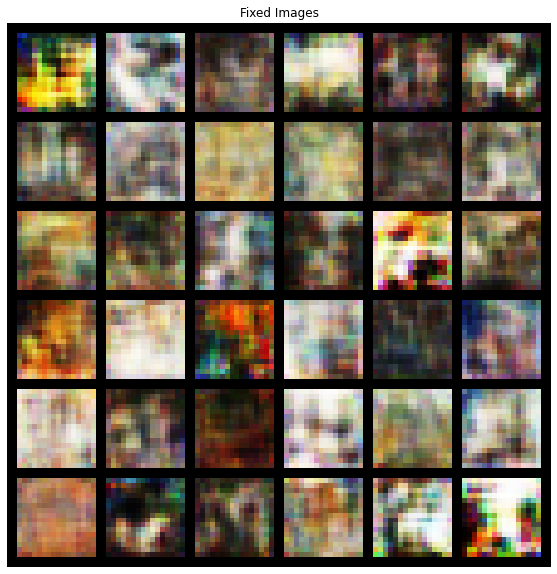

Epoch 20/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 20/60:   Disc_loss: -0.6553097480681935    Gen_loss: 0.5788473789291259


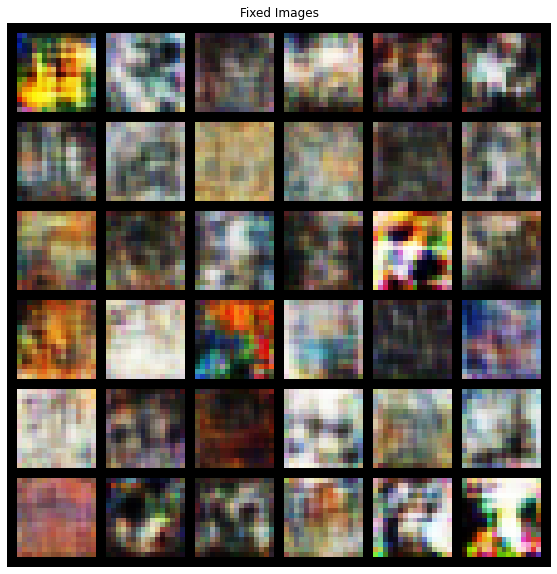

Epoch 21/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 21/60:   Disc_loss: -0.6355187016358036    Gen_loss: 0.5892354143794217


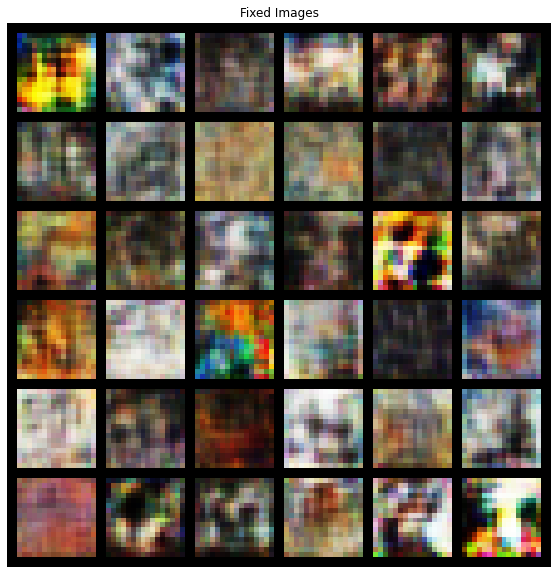

Epoch 22/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 22/60:   Disc_loss: -0.6458008380122268    Gen_loss: 0.6447911135855926


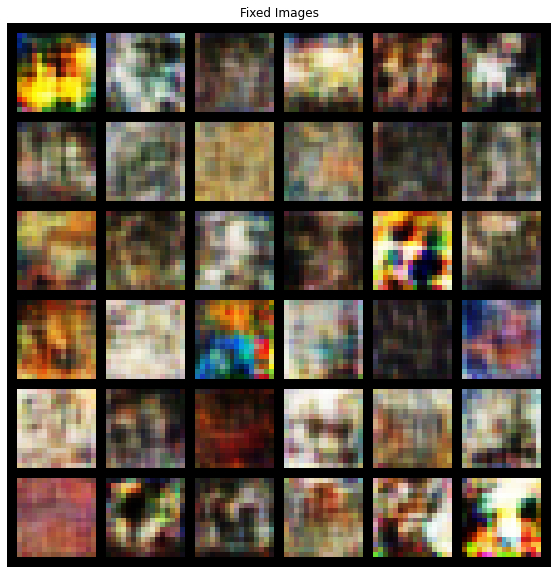

Epoch 23/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 23/60:   Disc_loss: -0.6497585548601169    Gen_loss: 0.7121392165707255


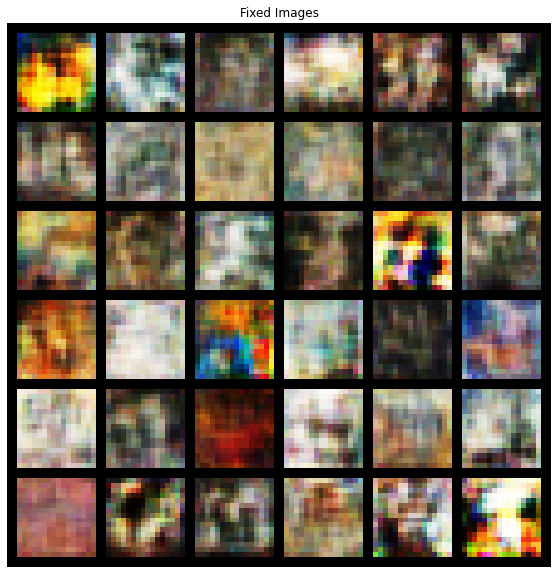

Epoch 24/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 24/60:   Disc_loss: -0.6454225103548497    Gen_loss: 0.7704179432781445


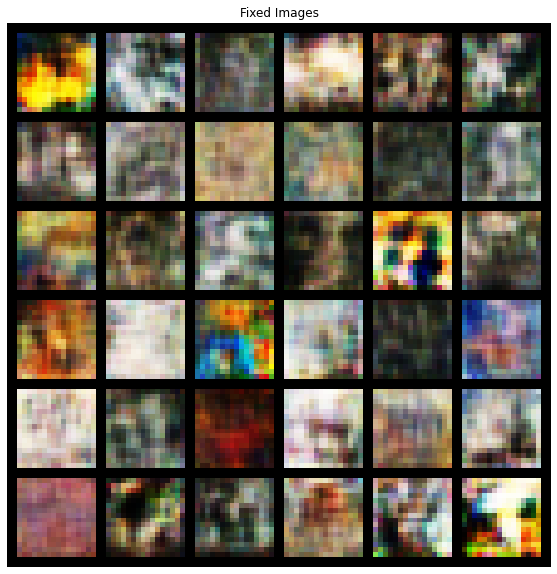

Epoch 25/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 25/60:   Disc_loss: -0.6272582156091986    Gen_loss: 0.8215118910776369


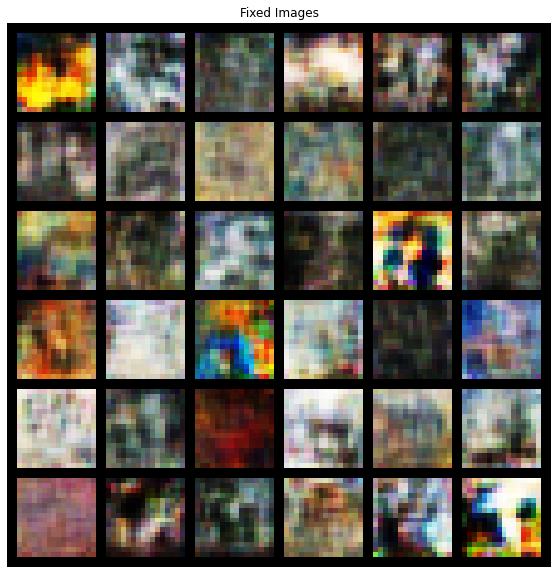

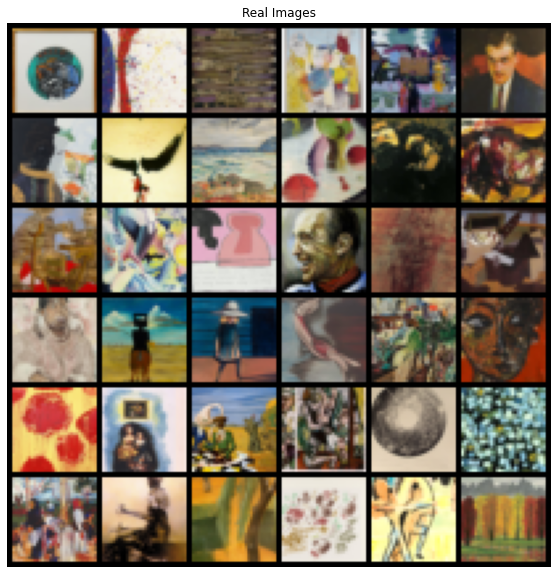


Current scale: 32 x 32

Epoch 26/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.9983333333333333
Alpha: 0.9966666666666666
Alpha: 0.9949999999999999
Alpha: 0.9933333333333332
Alpha: 0.9916666666666665
Alpha: 0.9899999999999998
Alpha: 0.9883333333333331
Alpha: 0.9866666666666664
Alpha: 0.9849999999999997
Alpha: 0.983333333333333
Alpha: 0.9816666666666662
Alpha: 0.9799999999999995
Alpha: 0.9783333333333328
Alpha: 0.9766666666666661
Alpha: 0.9749999999999994
Alpha: 0.9733333333333327
Alpha: 0.971666666666666
Alpha: 0.9699999999999993
Alpha: 0.9683333333333326
Alpha: 0.9666666666666659
Alpha: 0.9649999999999992
Alpha: 0.9633333333333325
Alpha: 0.9616666666666658
Alpha: 0.9599999999999991
Alpha: 0.9583333333333324
Alpha: 0.9566666666666657
Alpha: 0.954999999999999
Alpha: 0.9533333333333323
Alpha: 0.9516666666666656
Alpha: 0.9499999999999988
Alpha: 0.9483333333333321
Alpha: 0.9466666666666654
Alpha: 0.9449999999999987
Alpha: 0.943333333333332
Alpha: 0.9416666666666653
Alpha: 0.9399999999999986
Alpha: 0.9383333333333319
Alpha: 0.9366666666666652
Alpha: 0.9349999

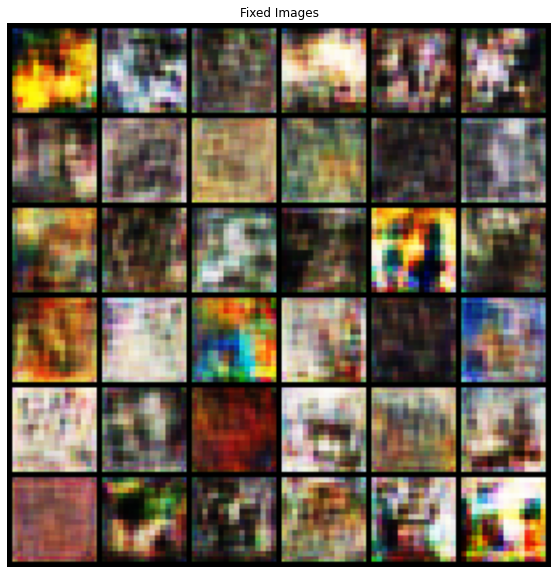

Epoch 27/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.7283333333333271
Alpha: 0.7266666666666604
Alpha: 0.7249999999999936
Alpha: 0.7233333333333269
Alpha: 0.7216666666666602
Alpha: 0.7199999999999935
Alpha: 0.7183333333333268
Alpha: 0.7166666666666601
Alpha: 0.7149999999999934
Alpha: 0.7133333333333267
Alpha: 0.71166666666666
Alpha: 0.7099999999999933
Alpha: 0.7083333333333266
Alpha: 0.7066666666666599
Alpha: 0.7049999999999932
Alpha: 0.7033333333333265
Alpha: 0.7016666666666598
Alpha: 0.6999999999999931
Alpha: 0.6983333333333264
Alpha: 0.6966666666666597
Alpha: 0.694999999999993
Alpha: 0.6933333333333263
Alpha: 0.6916666666666595
Alpha: 0.6899999999999928
Alpha: 0.6883333333333261
Alpha: 0.6866666666666594
Alpha: 0.6849999999999927
Alpha: 0.683333333333326
Alpha: 0.6816666666666593
Alpha: 0.6799999999999926
Alpha: 0.6783333333333259
Alpha: 0.6766666666666592
Alpha: 0.6749999999999925
Alpha: 0.6733333333333258
Alpha: 0.6716666666666591
Alpha: 0.6699999999999924
Alpha: 0.6683333333333257
Alpha: 0.666666666666659
Alpha: 0.66499999

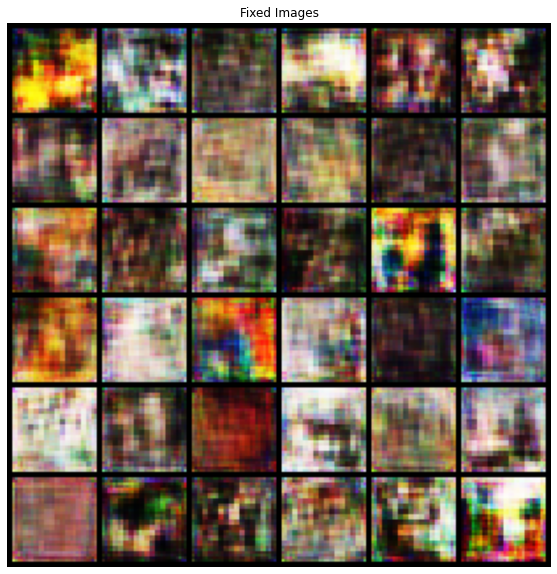

Epoch 28/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.45833333333332227
Alpha: 0.4566666666666556
Alpha: 0.45499999999998897
Alpha: 0.4533333333333223
Alpha: 0.45166666666665567
Alpha: 0.449999999999989
Alpha: 0.44833333333332237
Alpha: 0.4466666666666557
Alpha: 0.44499999999998907
Alpha: 0.4433333333333224
Alpha: 0.44166666666665577
Alpha: 0.4399999999999891
Alpha: 0.4383333333333225
Alpha: 0.4366666666666558
Alpha: 0.4349999999999892
Alpha: 0.4333333333333225
Alpha: 0.4316666666666559
Alpha: 0.4299999999999892
Alpha: 0.4283333333333226
Alpha: 0.4266666666666559
Alpha: 0.4249999999999893
Alpha: 0.4233333333333226
Alpha: 0.421666666666656
Alpha: 0.4199999999999893
Alpha: 0.4183333333333227
Alpha: 0.416666666666656
Alpha: 0.4149999999999894
Alpha: 0.4133333333333227
Alpha: 0.4116666666666561
Alpha: 0.40999999999998943
Alpha: 0.4083333333333228
Alpha: 0.40666666666665613
Alpha: 0.4049999999999895
Alpha: 0.40333333333332283
Alpha: 0.4016666666666562
Alpha: 0.39999999999998953
Alpha: 0.3983333333333229
Alpha: 0.39666666666665623
Alph

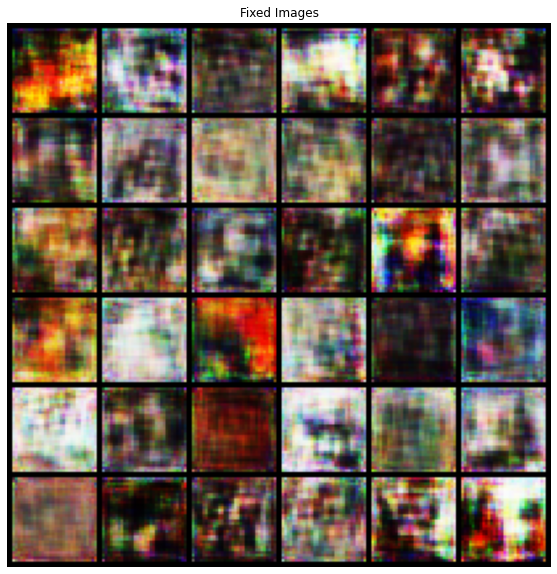

Epoch 29/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.18833333333332397
Alpha: 0.1866666666666573
Alpha: 0.18499999999999062
Alpha: 0.18333333333332394
Alpha: 0.18166666666665726
Alpha: 0.17999999999999058
Alpha: 0.1783333333333239
Alpha: 0.17666666666665723
Alpha: 0.17499999999999055
Alpha: 0.17333333333332387
Alpha: 0.1716666666666572
Alpha: 0.16999999999999052
Alpha: 0.16833333333332384
Alpha: 0.16666666666665717
Alpha: 0.1649999999999905
Alpha: 0.1633333333333238
Alpha: 0.16166666666665713
Alpha: 0.15999999999999046
Alpha: 0.15833333333332378
Alpha: 0.1566666666666571
Alpha: 0.15499999999999042
Alpha: 0.15333333333332375
Alpha: 0.15166666666665707
Alpha: 0.1499999999999904
Alpha: 0.1483333333333237
Alpha: 0.14666666666665704
Alpha: 0.14499999999999036
Alpha: 0.14333333333332368
Alpha: 0.141666666666657
Alpha: 0.13999999999999033
Alpha: 0.13833333333332365
Alpha: 0.13666666666665697
Alpha: 0.1349999999999903
Alpha: 0.13333333333332362
Alpha: 0.13166666666665694
Alpha: 0.12999999999999026
Alpha: 0.12833333333332358
Alpha: 0.126

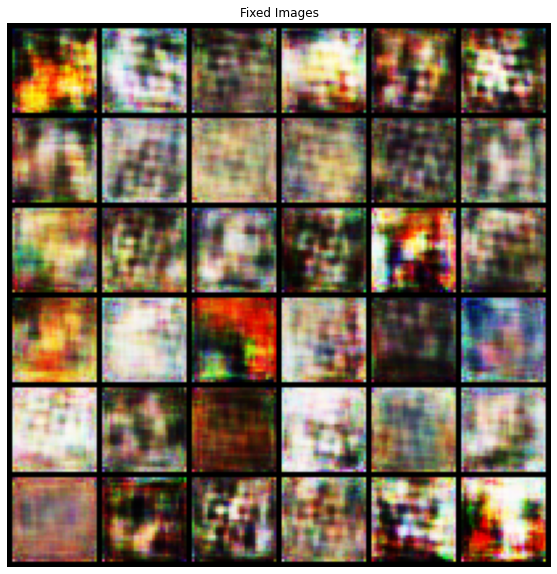

Epoch 30/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 30/60:   Disc_loss: -2.2526463637806775    Gen_loss: 1.9005159406224714


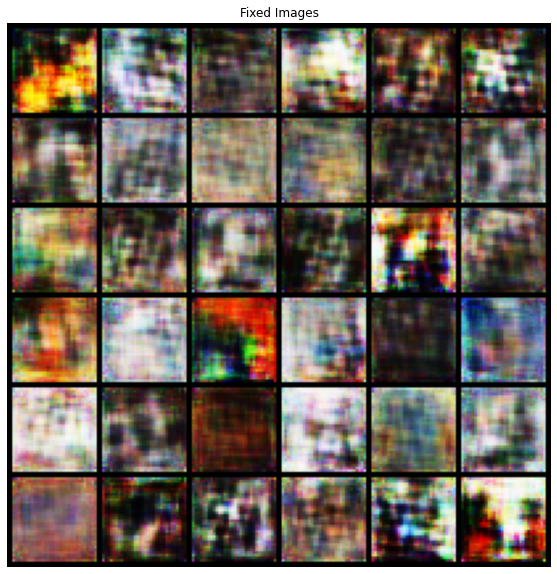

Epoch 31/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 31/60:   Disc_loss: -2.229426932357869    Gen_loss: 1.9091378374854264


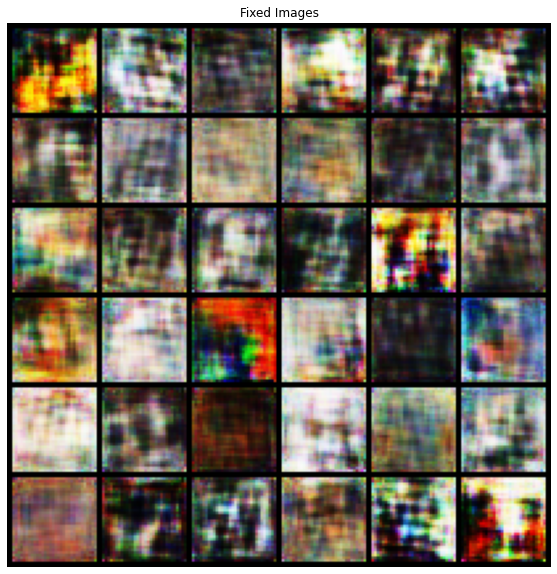

Epoch 32/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 32/60:   Disc_loss: -2.1735358842765207    Gen_loss: 1.9482756904259984


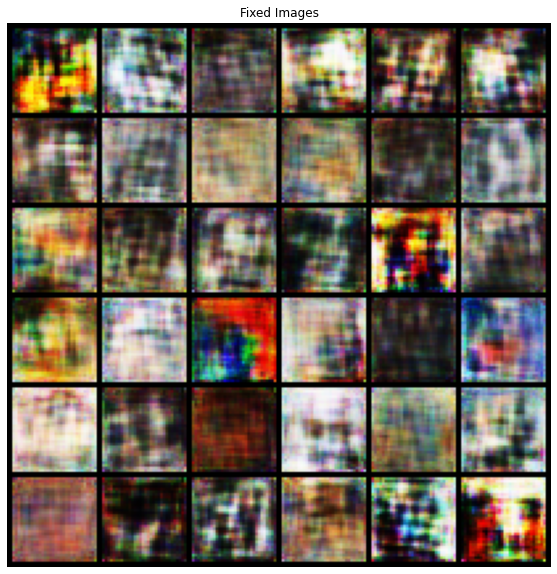

Epoch 33/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 33/60:   Disc_loss: -2.1091058658324684    Gen_loss: 1.9987886953424225


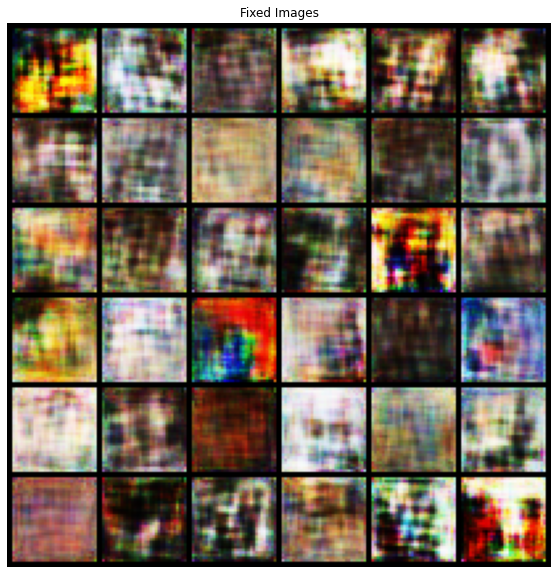

Epoch 34/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 34/60:   Disc_loss: -2.0542942737453473    Gen_loss: 2.0883417585322737


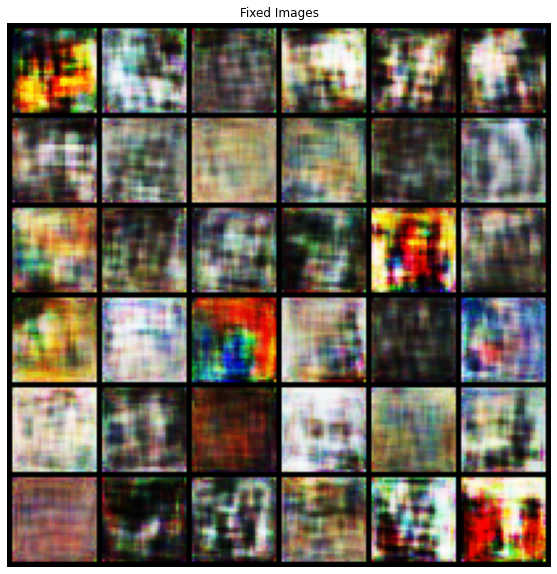

Epoch 35/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 35/60:   Disc_loss: -2.0142053662869284    Gen_loss: 2.160673397475843


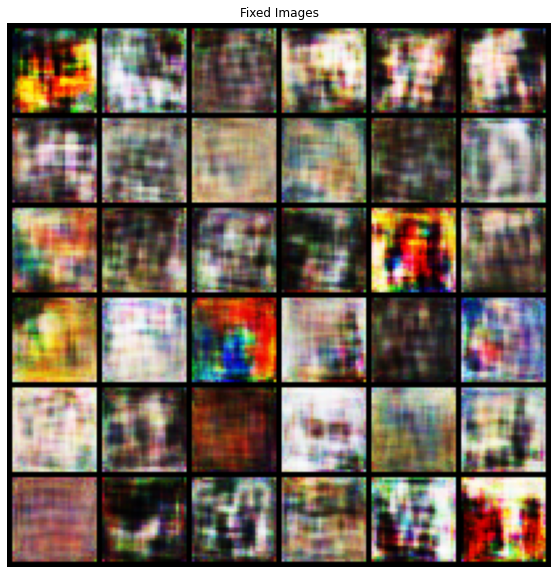

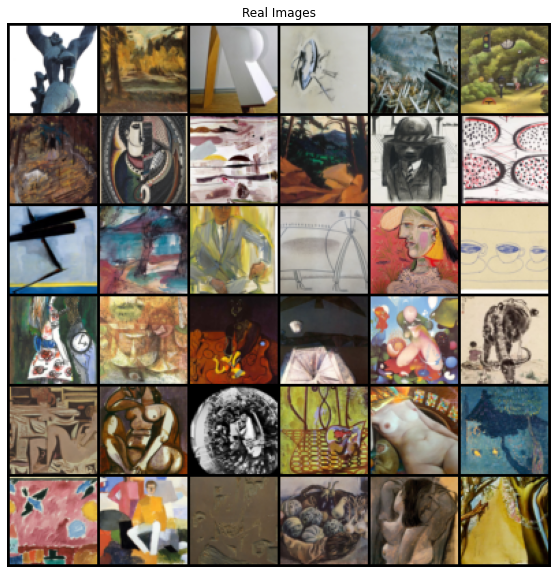


Current scale: 64 x 64

Epoch 36/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.9983333333333333
Alpha: 0.9966666666666666
Alpha: 0.9949999999999999
Alpha: 0.9933333333333332
Alpha: 0.9916666666666665
Alpha: 0.9899999999999998
Alpha: 0.9883333333333331
Alpha: 0.9866666666666664
Alpha: 0.9849999999999997
Alpha: 0.983333333333333
Alpha: 0.9816666666666662
Alpha: 0.9799999999999995
Alpha: 0.9783333333333328
Alpha: 0.9766666666666661
Alpha: 0.9749999999999994
Alpha: 0.9733333333333327
Alpha: 0.971666666666666
Alpha: 0.9699999999999993
Alpha: 0.9683333333333326
Alpha: 0.9666666666666659
Alpha: 0.9649999999999992
Alpha: 0.9633333333333325
Alpha: 0.9616666666666658
Alpha: 0.9599999999999991
Alpha: 0.9583333333333324
Alpha: 0.9566666666666657
Alpha: 0.954999999999999
Alpha: 0.9533333333333323
Alpha: 0.9516666666666656
Alpha: 0.9499999999999988
Alpha: 0.9483333333333321
Alpha: 0.9466666666666654
Alpha: 0.9449999999999987
Alpha: 0.943333333333332
Alpha: 0.9416666666666653
Alpha: 0.9399999999999986
Alpha: 0.9383333333333319
Alpha: 0.9366666666666652
Alpha: 0.9349999

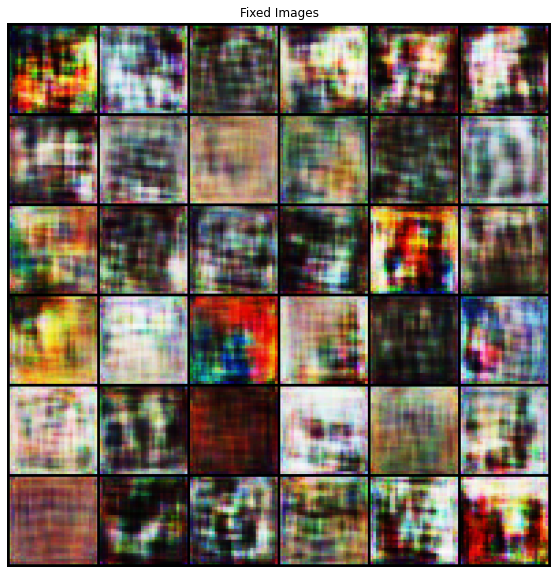

Epoch 37/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.7283333333333271
Alpha: 0.7266666666666604
Alpha: 0.7249999999999936
Alpha: 0.7233333333333269
Alpha: 0.7216666666666602
Alpha: 0.7199999999999935
Alpha: 0.7183333333333268
Alpha: 0.7166666666666601
Alpha: 0.7149999999999934
Alpha: 0.7133333333333267
Alpha: 0.71166666666666
Alpha: 0.7099999999999933
Alpha: 0.7083333333333266
Alpha: 0.7066666666666599
Alpha: 0.7049999999999932
Alpha: 0.7033333333333265
Alpha: 0.7016666666666598
Alpha: 0.6999999999999931
Alpha: 0.6983333333333264
Alpha: 0.6966666666666597
Alpha: 0.694999999999993
Alpha: 0.6933333333333263
Alpha: 0.6916666666666595
Alpha: 0.6899999999999928
Alpha: 0.6883333333333261
Alpha: 0.6866666666666594
Alpha: 0.6849999999999927
Alpha: 0.683333333333326
Alpha: 0.6816666666666593
Alpha: 0.6799999999999926
Alpha: 0.6783333333333259
Alpha: 0.6766666666666592
Alpha: 0.6749999999999925
Alpha: 0.6733333333333258
Alpha: 0.6716666666666591
Alpha: 0.6699999999999924
Alpha: 0.6683333333333257
Alpha: 0.666666666666659
Alpha: 0.66499999

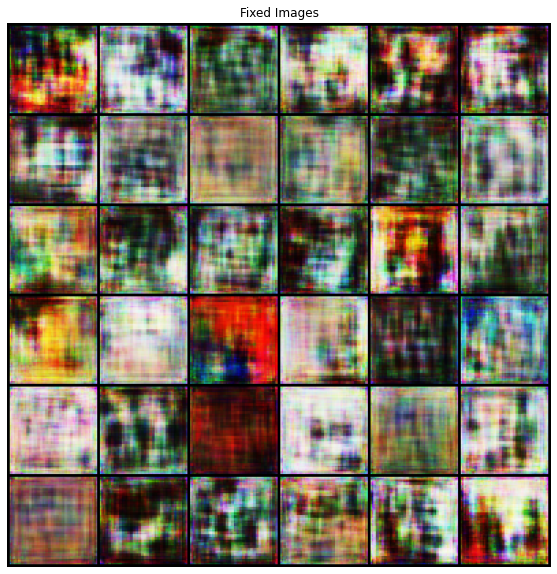

Epoch 38/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.45833333333332227
Alpha: 0.4566666666666556
Alpha: 0.45499999999998897
Alpha: 0.4533333333333223
Alpha: 0.45166666666665567
Alpha: 0.449999999999989
Alpha: 0.44833333333332237
Alpha: 0.4466666666666557
Alpha: 0.44499999999998907
Alpha: 0.4433333333333224
Alpha: 0.44166666666665577
Alpha: 0.4399999999999891
Alpha: 0.4383333333333225
Alpha: 0.4366666666666558
Alpha: 0.4349999999999892
Alpha: 0.4333333333333225
Alpha: 0.4316666666666559
Alpha: 0.4299999999999892
Alpha: 0.4283333333333226
Alpha: 0.4266666666666559
Alpha: 0.4249999999999893
Alpha: 0.4233333333333226
Alpha: 0.421666666666656
Alpha: 0.4199999999999893
Alpha: 0.4183333333333227
Alpha: 0.416666666666656
Alpha: 0.4149999999999894
Alpha: 0.4133333333333227
Alpha: 0.4116666666666561
Alpha: 0.40999999999998943
Alpha: 0.4083333333333228
Alpha: 0.40666666666665613
Alpha: 0.4049999999999895
Alpha: 0.40333333333332283
Alpha: 0.4016666666666562
Alpha: 0.39999999999998953
Alpha: 0.3983333333333229
Alpha: 0.39666666666665623
Alph

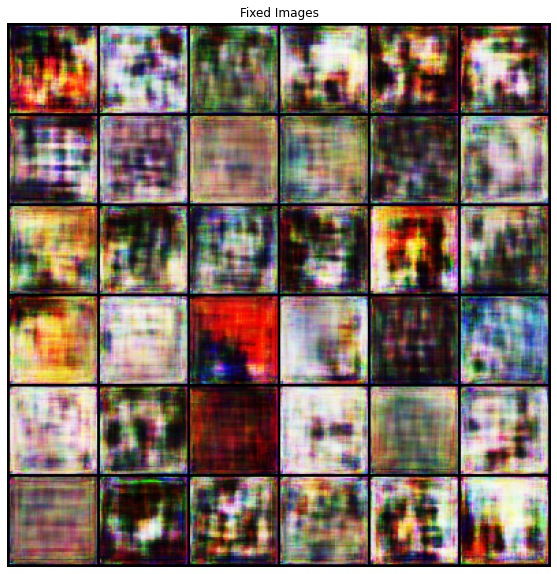

Epoch 39/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Alpha: 0.18833333333332397
Alpha: 0.1866666666666573
Alpha: 0.18499999999999062
Alpha: 0.18333333333332394
Alpha: 0.18166666666665726
Alpha: 0.17999999999999058
Alpha: 0.1783333333333239
Alpha: 0.17666666666665723
Alpha: 0.17499999999999055
Alpha: 0.17333333333332387
Alpha: 0.1716666666666572
Alpha: 0.16999999999999052
Alpha: 0.16833333333332384
Alpha: 0.16666666666665717
Alpha: 0.1649999999999905
Alpha: 0.1633333333333238
Alpha: 0.16166666666665713
Alpha: 0.15999999999999046
Alpha: 0.15833333333332378
Alpha: 0.1566666666666571
Alpha: 0.15499999999999042
Alpha: 0.15333333333332375
Alpha: 0.15166666666665707
Alpha: 0.1499999999999904
Alpha: 0.1483333333333237
Alpha: 0.14666666666665704
Alpha: 0.14499999999999036
Alpha: 0.14333333333332368
Alpha: 0.141666666666657
Alpha: 0.13999999999999033
Alpha: 0.13833333333332365
Alpha: 0.13666666666665697
Alpha: 0.1349999999999903
Alpha: 0.13333333333332362
Alpha: 0.13166666666665694
Alpha: 0.12999999999999026
Alpha: 0.12833333333332358
Alpha: 0.126

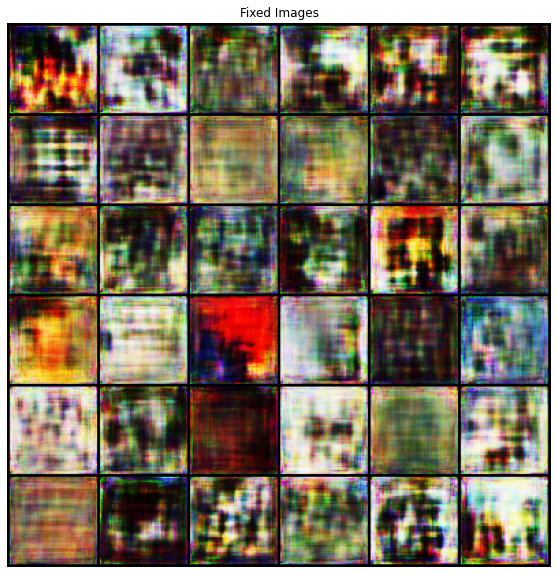

Epoch 40/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

Epoch 40/60:   Disc_loss: -4.914737340779204    Gen_loss: 2.7349287601191414


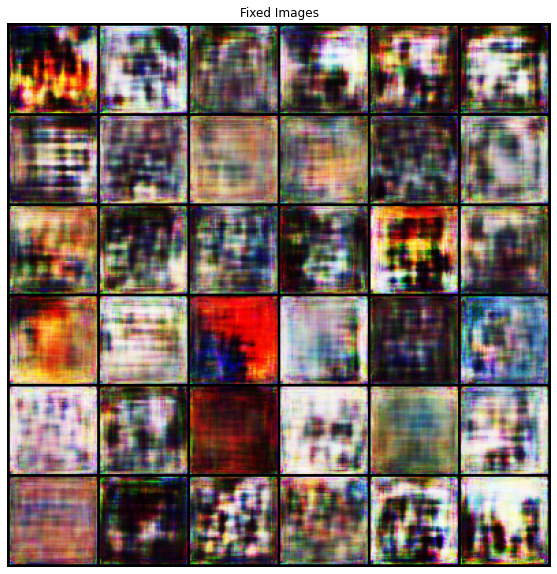

Epoch 41/60:


  0%|          | 0/2595 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [23]:
epochs = 60

current_disc_step = 0
disc_mean_loss = 0

currentBatch = 0

for epoch in range(epochs):
    torch.cuda.empty_cache()

    # Add new scale
    if scale < len(epochScales) and epoch == epochScales[scale]:
        # Adjust images in dataloader for new size
        current_image_size = 4 * (2 ** (scale + 1))
        if current_image_size >= 4:
            # dataloader = get_dataloader(current_image_size, use_custom_dataset=False)
            dataloader = get_dataloader(current_image_size)
            # Show some real images at current scale
            images = next(iter(dataloader))[0].to(device)[:num_images ** 2]
            plot_images(images)
        else:
            dataloader = get_dataloader(current_image_size)

            # Show some real images at current scale
            images = next(iter(dataloader))[:num_images ** 2]
            plot_images(images)


        # Increment scale index
        scale += 1

        # Add new scale
        scaleDepth = depthScales[scale]
        gen.addScaleBlock(scaleDepth)
        disc.addScaleBlock(scaleDepth)
        gen.to(device)
        disc.to(device)

        # Refresh alpha parameter
        alpha = 1.0
        gen.updateAlpha(alpha)
        disc.updateAlpha(alpha)
        currentBatch = 0
        alphaUpdateCount = 0

        print()
        print(f"Current scale: {current_image_size} x {current_image_size}")
        print()

    print(f"Epoch {epoch + 1}/{epochs}:")
    disc_total_loss = 0
    gen_total_loss = 0
    for data in tqdm(dataloader):

        currentBatch += 1

        # Update alpha
        if scale != 0 and currentBatch % alphaUpdatesBatches[scale] == 0 and alphaUpdateCount < alphaUpdates[scale]:
            alpha -= 1.0 / alphaUpdates[scale]
            gen.updateAlpha(alpha)
            disc.updateAlpha(alpha)
            print(f"Alpha: {disc.alpha}")
            alphaUpdateCount += 1

        # Get current batch of real images
        if current_image_size >= 4:
            images_real = data[0].to(device)
        else:
            images_real = data

        # Train discriminator for one step
        disc_loss = train_discriminator(disc, gen, images_real, lambdaGP, disc_optimizer)

        # Compute mean loss for discriminator for {disc_steps} steps
        disc_total_loss += disc_loss / disc_steps

        # Increment current step
        current_disc_step += 1

        # If the discriminator has been trained for {disc_steps} in a row, train the generator once
        if current_disc_step == disc_steps:
            gen_loss = train_generator(gen, disc, gen_optimizer)
            gen_total_loss += gen_loss

            # Print loss for both generator and discriminator
            # print(f"gen_loss {gen_loss}")
            # print(f"disc_mean_loss {disc_mean_loss}")
            # print()

            # Record loss for each network for later plotting
            # disc_losses.append(disc_loss)
            # gen_losses.append(gen_loss)

            # Reset current step and discriminator mean loss
            current_disc_step = 0
            # disc_mean_loss = 0

    disc_mean_loss = disc_total_loss / len(dataloader)
    gen_mean_loss = gen_total_loss / len(dataloader)

    # Print discriminator loss and generator loss
    print(f"Epoch {epoch + 1}/{epochs}:   Disc_loss: {disc_mean_loss}    Gen_loss: {gen_mean_loss}")

    # Record loss for each network for later plotting
    disc_losses.append(disc_mean_loss)
    gen_losses.append(gen_mean_loss)

    # Plot images generated from fixed latent vectors at current epoch
    fixed_images = gen(fixed_latent_vectors).detach()
    plot_images(fixed_images, num_images, "Fixed Images")


In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(gen_losses)
plt.plot(disc_losses)
plt.title("Training loss for Generator and Discriminator")
plt.legend(["Generator", "Discriminator"])
plt.xlabel("Iterations (through batches)")
plt.ylabel("Loss")
plt.show()

In [ ]:
random_latent_vectors = get_latent_vectors(num_images ** 2, z_dim)
generated_images = gen(random_latent_vectors).detach()
plot_images(generated_images, num_images, "Generated Images")

In [ ]:
random_latent_vectors = get_latent_truncated(4 ** 2, z_dim, 1)
generated_images = gen(random_latent_vectors).detach()
plot_images(generated_images, 4, "Generated Images")